## Final - Part A2: Gentrification Indexing
#### Notebook: Miles Cressy | Group: Race as Vulnerability: The Relationship between Policing and Gentrification

This notebook utilizes the metrics derived in the previous notebook in order to build an index for gentrification. We first go through each metric, cleaning and simplifying the dataframes, and then we will conduct a ranking of each neighborhood based on the value of importance. Once we've ranked each neighborhood independently, we will merge these dataframes together and combine their rankings into a single score with each metric weighed according to our methodology. These scores will then be sorted and categorized as "Very High", "High", "Medium" and "Low" gentrification levels, producing an interactive map at the end of the notebook.

__________________________________________________________________________________________________________________________________________________________________________________________________

Import various packages for data manipulation/cleaning and visualization.

In [20]:
# standard data manipulation
import pandas as pd
import numpy as np
# geospatial data manipulation/visualization
import geopandas as gpd
import plotly as pl
import plotly.express as px
import plotly.graph_objects as go
import libpysal as lp
import contextily as ctx
import json
import seaborn as sns
import plotly.offline as pyo

# advanced graph visualization
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import LinearLocator

# To ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [21]:
# bring in notebooks from previous notebook
permits = pd.read_csv('final_dfs/permits.csv')
rent = pd.read_csv('final_dfs/rent.csv')
race = pd.read_csv('final_dfs/race.csv')

# reduce columns to only the ones we will use
permits = permits[['name','Permit Number Percent Change']]
rent = rent[['name','Rent Price Percent Change']]
race = race[['name','total','white','black','combined_rank']]

### Part A2: Indexing Gentrification

We have multiple layers of information that help inform how we assess gentrification. In order to consolidate our visualizations, we will work to combine the first three variables defined previously: build permit issuance, rent price shifts and demographics. This will be done by sorting each neighborhood level dataframe then creating a new column that stores their rank once sorted. Following the creation of the individual rank for each metric, we will perform a simple function on the three ranks to combine them into a score that provides a rough estimation of how each neighborhood ranks in exhibiting forces of gentrification. Lastly, we will break down these scores in quantiles and assign each neighborhood a value of 'Very High', 'High', 'Medium' and 'Low' based on what quantile they fall into.

Sort the first two  dataframes, permits and rent, then add a ranking column based on measured value. First, let's drop some neighborhoods we know to be irrelevant for analysis based on our previous exercise.

In [22]:
# create list of dataframes so we can make changes to all three
df_list = [permits, rent, race]

# create for loop that removes observations based on conditions
for df in df_list: 
    df.drop(df[(df['name'] == "Hansen Dam") | (df['name'] == "Griffith Park") | (df['name'] == "Chatsworth Reservoir") | (df['name'] == "Elysian Park")].index, inplace=True)
    df.reset_index(inplace = True)

Now we'll create a new rank column based on the value of the column we are evaluating.

In [23]:
# create rank column for permits df
permits['rank'] = permits['Permit Number Percent Change'].rank(ascending=True)
# create rank column for rent df
rent['rank'] = rent['Rent Price Percent Change'].rank(ascending=True)

In [24]:
# view newly created column
permits.sort_values('Permit Number Percent Change')

,index,name,Permit Number Percent Change,rank
66,70,Pacoima,43.850806,1.0
22,23,Downtown,55.911518,2.0
94,98,Venice,66.962306,3.0
82,86,South Park,67.137809,4.0
71,75,Playa Vista,67.368421,5.0
...,...,...,...,...
52,56,Leimert Park,133.434650,106.0
16,16,Chatsworth,133.908046,107.0
81,85,Silver Lake,134.019370,108.0
54,58,Los Feliz,144.155844,109.0


In [25]:
# view newly created column
rent.sort_values('Rent Price Percent Change')

,index,name,Rent Price Percent Change,rank
8,8,Beverlywood,34.447301,1.0
15,15,Century City,50.737101,2.0
73,77,Porter Ranch,56.672622,3.0
105,109,Westwood,56.731595,4.0
65,69,Pacific Palisades,57.930884,5.0
...,...,...,...,...
37,41,Harbor City,206.101344,106.0
41,45,Highland Park,208.195435,107.0
38,42,Harbor Gateway,210.891262,108.0
20,21,Cypress Park,217.270106,109.0


In order to simplify the manner in which we combine the ranks later on, we will group the resulting ranks based on their percentile.

In [26]:
# create empty list to store values
permit_category = []
# run for loop that iterates on each row and assigns them a value based on their percentile
for value in permits["rank"]:
    if value <= np.percentile(permits['rank'], 20):
        permit_category.append(1)
    elif value <= np.percentile(permits['rank'], 40):
        permit_category.append(2)
    elif value <= np.percentile(permits['rank'], 60):
        permit_category.append(3)
    elif value <= np.percentile(permits['rank'], 80):
        permit_category.append(4)    
    else:
        permit_category.append(5)

# create new column from list above      
permits['permit_category'] = permit_category

# repeat for the rent dataframe 

# create empty list to store values
rent_category = []
# run for loop that iterates on each row and assigns them a value based on their percentile
for value in rent["rank"]:
    if value <= np.percentile(rent['rank'], 20):
        rent_category.append(1)
    elif value <= np.percentile(rent['rank'], 40):
        rent_category.append(2)
    elif value <= np.percentile(rent['rank'], 60):
        rent_category.append(3)
    elif value <= np.percentile(rent['rank'], 80):
        rent_category.append(4)    
    else:
        rent_category.append(5)
        
# create new column from list above           
rent['rent_category'] = rent_category

Check new dataframes one last time.

In [27]:
# view newly created column
permits.sort_values('Permit Number Percent Change',ascending=False)

,index,name,Permit Number Percent Change,rank,permit_category
72,76,Playa del Rey,146.031746,110.0,5
54,58,Los Feliz,144.155844,109.0,5
81,85,Silver Lake,134.019370,108.0,5
16,16,Chatsworth,133.908046,107.0,5
52,56,Leimert Park,133.434650,106.0,5
...,...,...,...,...,...
71,75,Playa Vista,67.368421,5.0,1
82,86,South Park,67.137809,4.0,1
94,98,Venice,66.962306,3.0,1
22,23,Downtown,55.911518,2.0,1


In [28]:
# view newly created column
rent.sort_values('Rent Price Percent Change',ascending=False)

,index,name,Rent Price Percent Change,rank,rent_category
71,75,Playa Vista,218.342776,110.0,5
20,21,Cypress Park,217.270106,109.0,5
38,42,Harbor Gateway,210.891262,108.0,5
41,45,Highland Park,208.195435,107.0,5
37,41,Harbor City,206.101344,106.0,5
...,...,...,...,...,...
65,69,Pacific Palisades,57.930884,5.0,1
105,109,Westwood,56.731595,4.0,1
73,77,Porter Ranch,56.672622,3.0,1
15,15,Century City,50.737101,2.0,1


We have our first two dataframes ranked, however, we should look at the race dataframe more critically as our methodology values this metric more highly. Not only did we rank our neighborhoods through a bivariate method, we want to be strategic with how we prioritize certain neighborhoods. In order to do so, we will categorize each "combined_rank" (derived in the previous notebook) in addition to creating a new column which assesses whether or not a neighborhood has a higher percentage of black renters than the total percentage of black residents in LA city (8%). 

In [29]:
# Ensure the rows are ranked by the combined_rank 
race=race.sort_values('combined_rank', ascending = False)
# create a new column that determines if the previous row is equal to the current row, this is how we will give a numeric value to our combined ranks
race['check'] = race['combined_rank'].eq(race['combined_rank'].shift())

# assign values to similar combined ranks
# create empty list to store values
race_category = []
count = 0
# iterate through rows
for value in race["check"]:
    if value == True:
        race_category.append(count)
    else:
        count += 1
        race_category.append(count)

# remove unnecessary columns
race = race.drop(columns=['check'])

# create new colummn based on for loop
race['race_category'] = race_category

# view dataframe
race.sort_values('race_category',ascending =False)

,index,name,total,white,black,combined_rank,race_category
0,0,Adams-Normandie,4246,1132,930,AA,16
99,99,Windsor Square,1863,546,134,AA,16
7,7,Broadway-Manchester,4211,975,1555,AA,16
56,56,Mount Washington,1146,619,12,AA,16
95,95,Westchester,3906,1953,588,AA,16
...,...,...,...,...,...,...,...
27,27,Glassell Park,4222,1500,119,DD,1
50,50,Manchester Square,1878,77,1387,DD,1
12,12,Chatsworth,3685,1796,684,DD,1
20,20,Echo Park,8200,3918,408,DD,1


Now let's create a new column that determines if the neighborhood contains a disproportionate number of black renters. These neighborhoods will be particularly critical in evaluating and highlighting.

In [30]:
# create empty list to store values
black_neighborhood = []
# iterate through rows to determine if neighborhood is disproportionately black
for index, row in race.iterrows():
    if row['black']/row['total']>.16:
        black_neighborhood.append(1)
    else:
        black_neighborhood.append(0)
# create new column based on stored list        
race['black_neighborhood'] = black_neighborhood
# view dataframe
race.sort_values('name')

,index,name,total,white,black,combined_rank,race_category,black_neighborhood
0,0,Adams-Normandie,4246,1132,930,AA,16,1
1,1,Arlington Heights,5179,1232,1203,CA,8,1
2,2,Atwater Village,2803,1466,8,AB,15,0
3,3,Baldwin Hills/Crenshaw,4388,530,2908,BD,9,1
4,4,Beverly Grove,6759,5250,374,DB,3,0
...,...,...,...,...,...,...,...,...
97,97,Westwood,4429,2751,158,BC,10,0
98,98,Wilmington,9508,5702,530,DA,4,0
99,99,Windsor Square,1863,546,134,AA,16,0
100,100,Winnetka,5510,1741,300,BC,10,0


We've ranked each dataframe and now we are ready to combine and consolidate to create our index. Let's isolate the neighborhood and rank columns and then generate new dataframes based off this so that we ultimately end up with a simplified dataframe that captures only the neighborhood and their score/final ranking.

In [31]:
# create simple dataframes with rank and neighborhood name
permits_index = permits[['name','permit_category']]
rent_index = rent[['name','rent_category']]
race_index = race[['name','race_category','black_neighborhood']]

Next, we'll merge the dataframes together so that we can create a unique score for each neighborhood based on their ranking for each metric.

In [32]:
# merge the dataframes
index_combined = permits_index.merge(rent_index, how="left", on="name").merge(race_index, how="left", on="name")
# drop neighborhoods where the race category is NaN
index_combined = index_combined.dropna()

Generate a new score column that adds together the rankings for each metric, with weights included in order to prioritize the key variables.

In [33]:
# create new score column
index_combined['score'] = .75* (index_combined['permit_category']) + 1* (index_combined['rent_category']) + .5* (index_combined['race_category']) + (index_combined['black_neighborhood'])*(.5*(.75*(index_combined['permit_category']) + 1*(index_combined['rent_category']) + .33*(index_combined['race_category'])))
# sort by score
index_combined = index_combined.sort_values('score', ascending = False)
# view new column
index_combined.head(30)

,name,permit_category,rent_category,race_category,black_neighborhood,score
0,Adams-Normandie,4,5,16.0,1.0,22.640
29,Exposition Park,3,5,12.0,1.0,18.855
100,West Adams,4,2,15.0,1.0,17.475
47,Jefferson Park,3,4,12.0,1.0,17.355
52,Leimert Park,5,2,13.0,1.0,17.270
11,Broadway-Manchester,1,3,16.0,1.0,16.265
51,Larchmont,5,4,16.0,0.0,15.750
103,Westchester,5,4,16.0,0.0,15.750
59,Mission Hills,5,5,13.0,0.0,15.250
17,Chesterfield Square,3,2,13.0,1.0,15.020


Next, we'll write a for loop that classifies each score into a "Gentrification Level" based on what quantile the score falls into.

In [34]:
# see the cut off values for each specified quantile.
index_combined.score.quantile([.90,.75,.5])

0.90    14.973
0.75    12.500
0.50    10.500
Name: score, dtype: float64

In [35]:
# create empty object to store values
gentrification_level = []
# iterate through each row and classify each neighbhorhood by the quantile of their score.
for value in index_combined["score"]:
    if value >= np.percentile(index_combined['score'], 90):
        gentrification_level.append("Very High")
    elif value >= np.percentile(index_combined['score'], 75):
        gentrification_level.append("High")
    elif value >= np.percentile(index_combined['score'], 50):
        gentrification_level.append("Medium")
    else:
        gentrification_level.append("Low")
    
index_combined['Gentrification Level'] = gentrification_level
index_combined = index_combined[['name','Gentrification Level']]
index_combined

,name,Gentrification Level
0,Adams-Normandie,Very High
29,Exposition Park,Very High
100,West Adams,Very High
47,Jefferson Park,Very High
52,Leimert Park,Very High
...,...,...
25,Echo Park,Low
36,Hancock Park,Low
7,Beverly Grove,Low
74,Rancho Park,Low


Our last step is to integrate the geometry from the neighborhood boundary data so that we can visualize our index spatially. We'll bring the boundaries, conduct a merge, then set the geometry.

In [36]:
# import LA neighborhoods from ArcGIS
nbh = gpd.read_file("https://services5.arcgis.com/7nsPwEMP38bSkCjy/arcgis/rest/services/LA_Times_Neighborhoods/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson")

# spatial join on dataframes created above and neighborhood geodataframe
index_combined = index_combined.merge(nbh, how="left", on="name")

# set geometry
index_combined = index_combined.set_geometry('geometry')

Now that each neighborhood has been appropriately assigned a gentrification level and the dataframe has been converted into a geodataframe, let's plot a choropleth map using our previously defined function. We'll take the same code we used to define a choropleth function from our previous notebook.

In [37]:
# create function that takes inputs for data, value to measure, a descriptive title, latitude, longitude and bounds for the measured value.
# output is an interactive choropleth map
def chor_map(data=index_combined,
             color = 'Gentrification Level', 
             title = 'Interactive Map', 
             lat = 34.02, 
             lon = -118.38, 
             range_color=(), 
             cmap = "dense", 
             color_discrete = px.colors.qualitative.G10,
             color_discrete_map = {},
             title_x = .1):
    # create chloropleth map
    fig = px.choropleth_mapbox(data, geojson=data['geometry'], locations=data.index, color=color,
                               mapbox_style="carto-positron",
                               range_color=range_color,
                               zoom=9.15, 
                               center = {"lat": lat, "lon": lon},
                               opacity=0.6,
                               hover_name = 'name',
                               color_continuous_scale = cmap,
                               color_discrete_sequence=color_discrete,
                               color_discrete_map=color_discrete_map)

    # options on the layout
    fig.update_layout(
        width = 1000,
        height = 800,
        title = title,
        title_y=.96,
        title_x=title_x,
    ) 
    fig.write_html("map.html")
    fig.show()

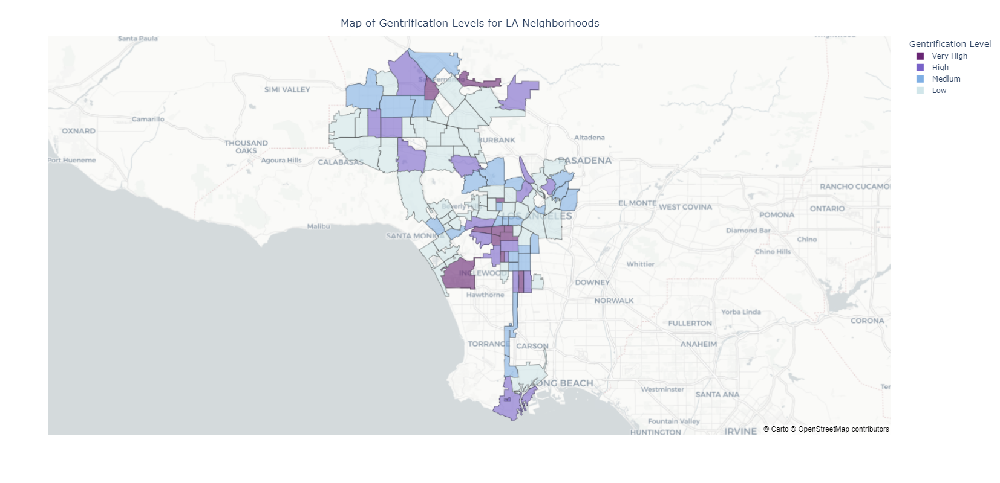

In [38]:
# generate choropleth map of the gentrification levels defined above.
chor_map(data=index_combined, 
         color="Gentrification Level", 
         title = "Map of Gentrification Levels for LA Neighborhoods",
         title_x = .47,
         color_discrete_map={
                "Very High": "#682573",
                "High": "#7863c9",
                "Medium": "#7fafe4",
                "Low": "#d1e6ea"}) 

We now have a way to visualize gentrification through a singular metric/output. Previously, we relied on disparate data sets to assess gentrification separately but now we can progress our overlaying of policing data. We've created a very simple process to classify gentrification levels and as a result, do not necessarily capture the all of the neighborhoods we might expect. Although our team feels confident in our methodology, the process of gentrification is immensely complex and difficult to capture precisely. Therefore, we cannot say for certain that our index appropriately captures gentrification levels for all neighborhoods.

That being said, we are ready to delve into arrest data and begin examining the relationship between gentrification and low level arrests.

In [39]:
# simplify dataframe for export
index_combined = index_combined[['name','Gentrification Level','geometry']]
# save down as csv
index_combined.to_csv('final_dfs/index.csv', index=False)